In [1]:
import sys
from collections import defaultdict

import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

import numpy as np
from PIL import Image, ImageDraw

import torch

sys.path.append(r"../")
from ct_assist import transform

# Finding head-feet pairs from instance masks
These functions aren't final, see the script files in ct_assist for actual implementations

## Load image

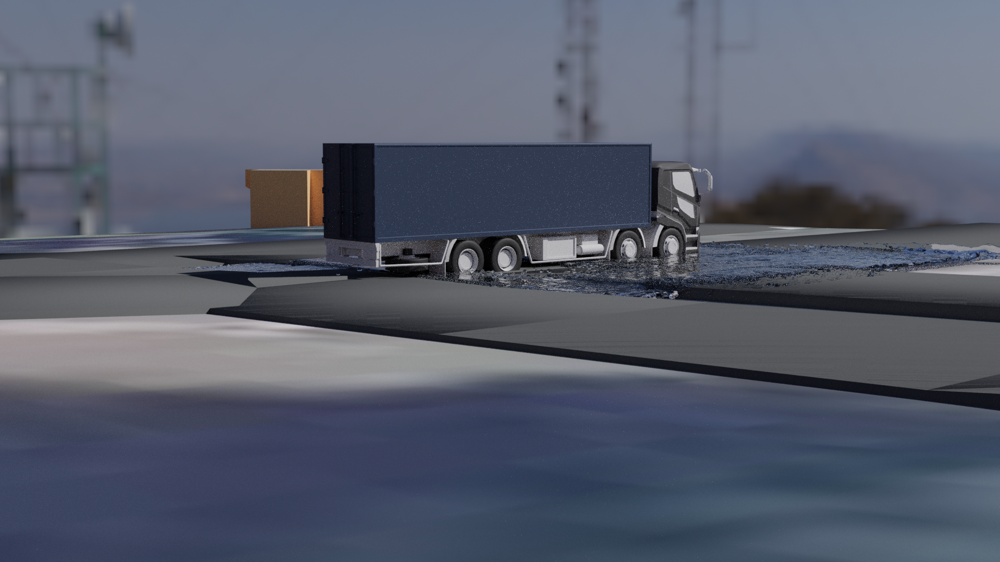

In [2]:
# Relative to my machine, not in Github!
# img_path = r"D:..\..\notes\img\real.jpg"
# img_path = r"D:..\..\jonasdata\fluid_res_310\images\render_0.png"
# img_path = r"D:..\..\notes\img\tb-2018-inbeeld-152.jpg"
img_path = r"..\notebooks\data\trucks\render_0.png"

img = Image.open(img_path)
img

## Load predictor
This helper function loads a Detectron2 DefaultPredictor from a model_url. The standard arguments defaults to the COCO-trained mask-rcnn model. If return_cfg is true, one can return the config.

In [3]:
def load_model(model_url="COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml", threshold=0.7, return_cfg=False):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file(model_url))
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = threshold
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_url)
    predictor = DefaultPredictor(cfg)
    if return_cfg:
        return predictor, cfg
    else:
        return predictor
    
predictor, cfg = load_model(return_cfg=True)

The user has to make the predictions themselves. This way, the user gets to use their own model, no matter the inputs required.

In [4]:
preds = predictor(np.asarray(img)[...,:3])  # Detectron2 expects 3D array, e.g. .PNG is 4D
preds

C:\Users\Caspe\Anaconda3\envs\ct_assist\lib\site-packages\detectron2\layers\wrappers.py:240: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  ..\torch\csrc\utils\python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


{'instances': Instances(num_instances=1, image_height=1080, image_width=1920, fields=[pred_boxes: Boxes(tensor([[ 619.6533,  272.9692, 1355.1964,  532.9693]], device='cuda:0')), scores: tensor([0.9633], device='cuda:0'), pred_classes: tensor([7], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]]], device='cuda:0')])}

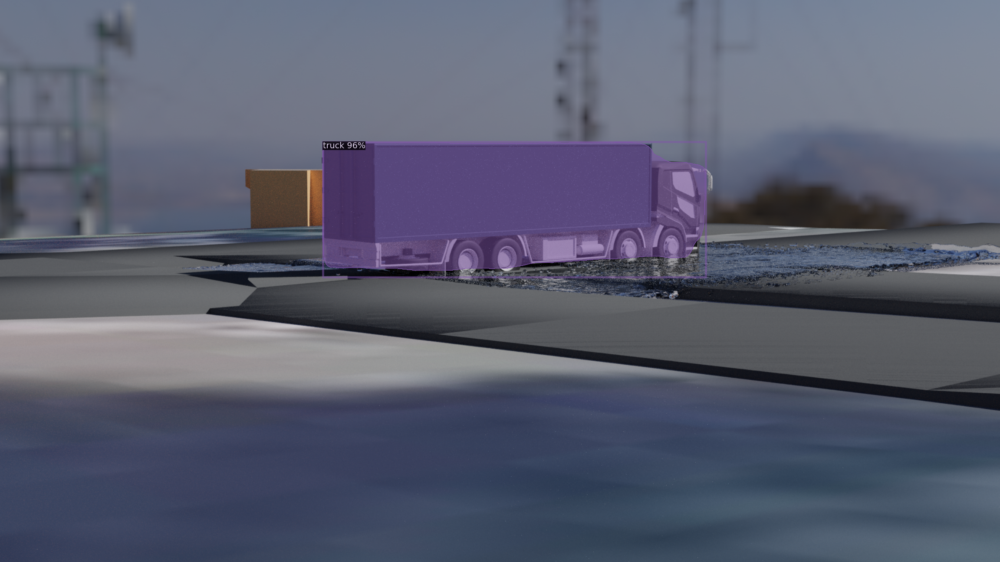

In [5]:
v = Visualizer(np.asarray(img)[...,:3][:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(preds["instances"].to("cpu"))
Image.fromarray(out.get_image()[:, :, ::-1])

In order to more easily parse the predictions made by Detectron2, I reshape it to a dictionary mapping the string representation of the detected object (e.g. "Truck") to a list of binary masks representing said objects.

In [6]:
def instances_to_dict(preds, thing_classes):
    class_dict = defaultdict(list)
    ins = preds["instances"]
    masks = ins.get("pred_masks")
    classes = ins.get("pred_classes")
    for i in range(len(ins)):
        class_int = classes[i].item()
        class_str = thing_classes[class_int]
        mask = masks[i]
        class_dict[class_str].append(mask)
    return class_dict

d = instances_to_dict(preds, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).get("thing_classes"))

## Algorithm
 1. Get all coordinates on mask where True
 2. Group coordinates by x-coordinate
 3. Find minimum and maximum value for y in each group
 4. head = (x, max_y), feet = (x, min_y)
 
This is the basic algorithm. Polygons are often oddly shaped, there can be a wingview mirror, or some space between the wagon and the cockpit, that suddenly causes a massive drop or increase in distance between points (i.e., outliers!). As CameraTransform is sensitive to these problems, we need to remove these. 
 
The first way to do this, is to skip the groups where the maximum y equals the minimum y. This removes the most drastic outliers. 

 5. If minimum y equals maximum y, skip this group


The next step is to compare all of the distances to the median distance. Here, the user can input an offset. This offset represents the distance from the median, in percentages, which is deemed acceptable by the user.
 6. Minimum distance = (1 + offset) * median distance
 7. Maximum distance = (1 - offset) * median distance
 8. If minimum distance >= distance >= maximum distance, skip this group
 
This *should* handle most if not all of the outliers. Then finally, this algorithm may still return too many reference point. In order to handle this, you simply take every *n*th object (i.e., implement a step size).


 

In [7]:
def get_heads_feet(mask: torch.tensor, step_size=5, offset=0.1):
    head, feet = [], []
    # Get all points where point == 1 (mask)
    mask_points = torch.nonzero(mask)  # .nonzero()
    # For each unique value for the x-plane
    for x in torch.unique(mask_points[..., 1]):
        # Get the indices at which mask[:, x] == x
        index = torch.nonzero(mask_points.T[1] == x)  # .nonzero()
        # Get all values for y where mask[:, x] == x
        ys = mask_points[index, 0]
        # Get max and min y, cast to CPU
        max_y, min_y = ys.max().item(), ys.min().item()
        # Remove max_y == min_y
        if max_y != min_y:
            # Cast x to CPU
            x = x.item()
            head.append([x, max_y])
            feet.append([x, min_y])
    # Turn head, feet into a numpy array and reverse
    reference = np.array([head, feet])[::-1]
    # Calculate all distances between heads and feet
    dist = (reference[1] - reference[0])[:, 1]
    median_dist = np.median(dist)
    min_dist = (1 - offset) * median_dist
    max_dist = (1 + offset) * median_dist
    # Threshold is median_dist +- offset
    min_mask = min_dist <= dist
    max_mask = dist <= max_dist
    # Remove those that are outside the threshold
    reference = reference[:, min_mask == max_mask]

    # Apply step size
    return reference[:, 0::step_size]

# reference = get_heads_feet(d.get("truck")[0], step_size=5)

This is a small function I wrote to handle the above algorithm for multiple objects.

In [8]:
def extract_reference(objects: dict, step_size=10, offset=0.05):
    args = []
    for key, masks in objects.items():
        if key != "truck":
            continue
        refs = [get_heads_feet(mask, step_size=step_size, offset=offset) for mask in masks]
        refs = np.concatenate(refs, axis=1)
        height = 3.9  # FIXME placeholder
        STD = 0.1  # FIXME placeholder
        args.append((refs, height, STD))
    return args

args = extract_reference(d)

And finally a small visualiser.

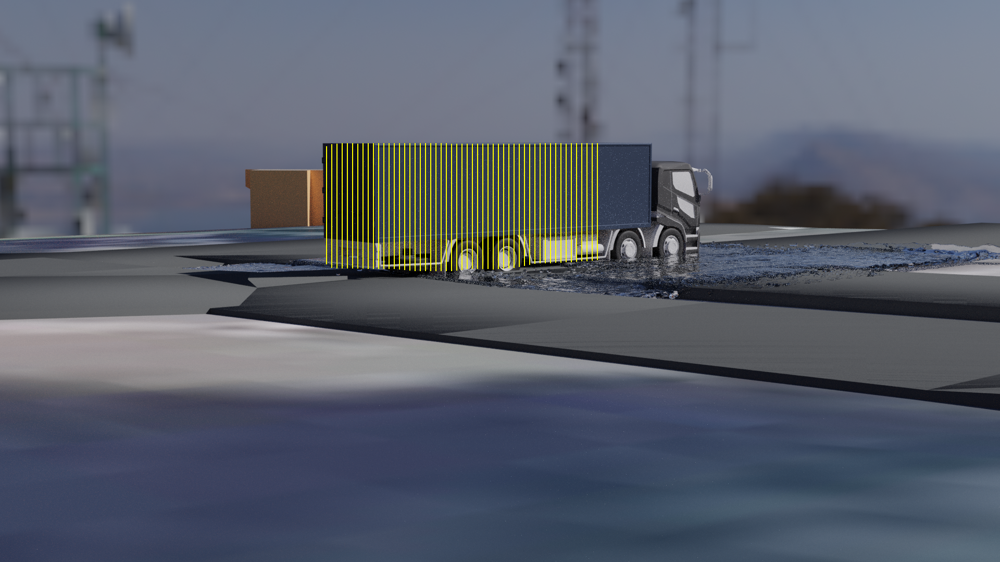

In [9]:
def visualize(img_path, args, show=True):
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img)
    for arg in args:
        reference = arg[0]
        min_ = (0.8 * np.max(reference[1] - reference[0]))
        for i in range(reference.shape[1]):
            heads, feet = reference[:, i]
            draw.line([(*heads), (*feet)], fill="yellow", width=2)
    if show:
        img.show()
    return img
    
visualize(img_path, args, show=False)

The results of this are very interesting. While it appears to capture the decreasing size of the lines as the truck moves further away. One problem with this algorithm, is that it doesn't properly account for the rotation of the object. The lines always go directly down. This will most likely cause approximation of the roll degree to be less accurate.

Ideally, the images taken are always in portrait mode, meaning the roll degree will always be approximately 0.

## Using found heads and feet to predict camera parameters

In [10]:
# Grab one object
arg = args[0]

In [11]:
cam = transform.fit(img=img, reference=arg[0], height=arg[1], STD=arg[2], meta_data={"focal_length":50.0, "sensor_size": (24.0, 36.0), "image_size": (1920, 1080)}, iters=1e5)
params = cam.orientation.parameters
params = np.array((params.roll_deg, params.tilt_deg, params.heading_deg, params.elevation_m))
params

array([-4.86749113e-02,  8.61677150e+01, -8.52168621e+01,  3.95345941e+00])

Real

In [12]:
# Real:
real = np.array((0, 84.16779448324309, 47.19223369280777, 11.382741928100586 - 4.030753135681152))
real

array([ 0.        , 84.16779448, 47.19223369,  7.35198879])

Error

In [13]:
(real - params)

array([ 4.86749113e-02, -1.99992049e+00,  1.32409096e+02,  3.39852938e+00])

## Generate heads-feet for all renders

In [14]:
import os
from tqdm import tqdm

In [15]:
# Local to my machine, not on Github!
renders = os.listdir(r"D:..\..\jonasdata\fluid_res_310\images")
renders[:5] # Show first 5

['render_0.png',
 'render_1.png',
 'render_10.png',
 'render_11.png',
 'render_12.png']

In [16]:
paths = list(map(lambda x: r"D:..\..\jonasdata\fluid_res_310\images\\" + x, renders))  # Used twice
imgs = map(Image.open, paths)
arrs = map(lambda x: np.asarray(x)[...,:3], imgs)

In [17]:
predictor, cfg = load_model(return_cfg=True)

preds = map(predictor, arrs)

instance_dicts = map(lambda x: instances_to_dict(x, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).get("thing_classes")), preds)

references = map(extract_reference, instance_dicts)

new_images = map(lambda x: visualize(x[0], x[1], False), zip(paths, references))

In [18]:
# # Save images
# for render, img in tqdm(zip(renders, new_images)):
#     path = f"..\\notebooks\\data\\heads_feet\\" + render
# #     path = f"..\\notebooks\\data\\no_tolerance\\" + render
#     img.save(path)